### Importing the Dependencies

In [1]:
import cv2
import pandas as pd
import numpy as np
from tqdm import tqdm
import tensorflow as tf
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.Session(config=config)
from keras.backend.tensorflow_backend import set_session
set_session(tf.Session(config=config))
#import keras
from keras import backend as K
K.set_image_dim_ordering('tf')
from keras.models import Model
import numpy as np
from keras.applications.imagenet_utils import preprocess_input
from keras.preprocessing import image
from matplotlib.pyplot import imshow
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten,Activation, Conv2D, MaxPooling2D,BatchNormalization,GlobalAveragePooling2D
from keras.callbacks import EarlyStopping
from keras.utils import to_categorical




/work/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


### Analysing and loading of Data 

In [2]:
train=pd.read_csv("./labels.csv")

In [350]:
#dummy labels to get the list of columns and also to convert to one hot encoding
ylabels=train['breed']

df=pd.get_dummies(ylabels)

list_of_breeds=list(df.columns)

In [351]:
list_of_breeds

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [353]:
ylabels1=np.array(df)
ylabels1.shape

(10222, 120)

In [354]:
df=train.groupby("breed").count()

In [355]:
#this shows the count of images per each class
print(df)

                                 id
breed                              
affenpinscher                    80
afghan_hound                    116
african_hunting_dog              86
airedale                        107
american_staffordshire_terrier   74
appenzeller                      78
australian_terrier              102
basenji                         110
basset                           82
beagle                          105
bedlington_terrier               89
bernese_mountain_dog            114
black-and-tan_coonhound          77
blenheim_spaniel                102
bloodhound                       85
bluetick                         85
border_collie                    72
border_terrier                   91
borzoi                           75
boston_bull                      87
bouvier_des_flandres             86
boxer                            75
brabancon_griffon                67
briard                           66
brittany_spaniel                 73
bull_mastiff                

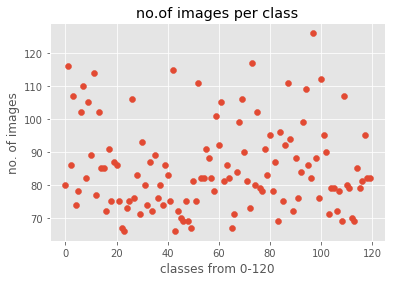

In [356]:
#plotting it in the form of curve
l=df['id'].values

#import numpy as np

x_axis=np.arange(120)

plt.scatter(x_axis,l)
plt.xlabel('classes from 0-120')
plt.ylabel('no. of images')
plt.title('no.of images per class')
plt.show()

Loading of images

In [335]:
# here we are loading the images and just doing the scaling of images
from keras.preprocessing import image
def read_img(img_path):
    img = image.load_img(img_path,target_size=(400,400,3))
    arr=image.img_to_array(img)
    return arr/255

In [11]:
trainimages=[]
for img_path in tqdm(train['id'].values):
        trainimages.append(read_img("/home/saiaravinds/train/"+ img_path+".jpg"))

100%|██████████| 10222/10222 [01:15<00:00, 136.10it/s]


In [12]:
trainimages=np.array(trainimages)

Splitting of data in to train and validation

In [357]:
from sklearn.model_selection import StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.1, random_state=5)
for train_index, test_index in sss.split(trainimages,ylabels):
        X_train,X_test = trainimages[train_index], trainimages[test_index]
        y_train, y_test = ylabels[train_index], ylabels[test_index]

In [358]:
#Making all the one hot vectors in to class numbers
y_train1=np.argmax(y_train,1)

In [255]:
#calculating the class_weights to adjust for class imbalance
from sklearn.utils import class_weight
class_weight = class_weight.compute_class_weight('balanced',
                                                 np.unique(y_train1),
                                                 y_train1)

In [256]:
class_weight

array([1.06469907, 0.73709936, 0.99556277, 0.79852431, 1.14415423,
       1.09511905, 0.83324275, 0.7743266 , 1.03592342, 0.81551418,
       0.95822917, 0.74425566, 1.11099034, 0.83324275, 0.99556277,
       0.99556277, 1.17935897, 0.93485772, 1.12732843, 0.98279915,
       0.99556277, 1.12732843, 1.27763889, 1.29929379, 1.1614899 ,
       1.12732843, 0.80692982, 1.12732843, 1.02211111, 1.19778646,
       0.91259921, 1.06469907, 1.14415423, 0.98279915, 1.17935897,
       0.95822917, 1.12732843, 1.06469907, 1.14415423, 0.99556277,
       1.02211111, 1.12732843, 0.74425566, 1.29929379, 1.17935897,
       1.21679894, 1.23642473, 1.12732843, 1.23642473, 1.27763889,
       1.05011416, 1.12732843, 0.76658333, 1.03592342, 1.03592342,
       0.93485772, 0.97035865, 1.03592342, 1.09511905, 0.84239927,
       0.92359438, 0.81551418, 1.05011416, 0.99556277, 1.03592342,
       1.27763889, 1.19778646, 1.00866228, 0.86132959, 0.80692982,
       0.94639918, 1.05011416, 1.1614899 , 0.73007937, 1.06469

## Importing the pretrained models

In [17]:
from keras.applications.inception_resnet_v2 import InceptionResNetV2

base_model1= keras.applications.xception.Xception(include_top=False, weights='imagenet',input_shape=(400,400,3),pooling='avg')

base_model2= keras.applications.inception_v3.InceptionV3(include_top=False, weights='imagenet',input_shape=(400,400,3),pooling='avg')

base_model3 =InceptionResNetV2(include_top=False , weights='imagenet',input_shape=(400,400,3),pooling='avg')


In [18]:
#getting the bottle -neck features from each of the model
xpreds=base_model1.predict(x=X_train,batch_size=50)
print(xpreds.shape)
ipreds=base_model2.predict(x=X_train,batch_size=50)
print(ipreds.shape)
irpreds=base_model3.predict(x=X_train,batch_size=50)
print(irpreds.shape)

(9199, 2048)
(9199, 2048)
(9199, 1536)


In [19]:
#Concatenating the features
Xtrain=np.concatenate([irpreds,ipreds,xpreds],axis=-1)
Xtrain.shape

(9199, 5632)

In [20]:
#generating the bottle neck features for the flipped images
xfpreds=base_model1.predict(x=np.flip(X_train,axis=2),batch_size=10)
print(xfpreds.shape)
ifpreds=base_model2.predict(x=np.flip(X_train,axis=2),batch_size=10)
print(ifpreds.shape)
irfpreds=base_model3.predict(x=np.flip(X_train,axis=2),batch_size=10)
print(irfpreds.shape)

(9199, 2048)
(9199, 2048)
(9199, 1536)


In [21]:
#concatenating the flipped features
Xftrain=np.concatenate([irfpreds,ifpreds,xfpreds],axis=-1)
Xftrain.shape

(9199, 5632)

In [22]:
#for test images
txpreds=base_model1.predict(x=X_test,batch_size=30)
tipreds=base_model2.predict(x=X_test,batch_size=30)
tirpreds=base_model3.predict(x=X_test,batch_size=30)

In [23]:
# for the flipped test images
txfpreds=base_model1.predict(x=np.flip(X_test,axis=2),batch_size=50)
tifpreds=base_model2.predict(x=np.flip(X_test,axis=2),batch_size=50)
tirfpreds=base_model3.predict(x=np.flip(X_test,axis=2),batch_size=50)

In [24]:
#concatenating the features
Xtest=np.concatenate([tirpreds,tipreds,txpreds],axis=-1)
Xtest.shape

(1023, 5632)

In [25]:
#concatenating the flipped features
Xftest=np.concatenate([tirfpreds,tifpreds,txfpreds],axis=-1)
Xftest.shape

(1023, 5632)

In [28]:
xtrain.shape

(18398, 5632)

In [29]:
xtest.shape

(2046, 5632)

In [135]:
y_test1=np.concatenate([y_test,y_test],axis=0)

### model implementation

In [370]:
def mymodel():
    model = Sequential()
    model.add(Dense(2048,input_shape=(5632,)))
    model.add(Activation('elu'))
    model.add(Dropout(0.5))
    model.add(Dense(120))
    #model.add(Dense(120))
    model.add(Activation('softmax'))
    return model

In [95]:
callbacks1=keras.callbacks.ModelCheckpoint('mod1.h5', monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=True, mode='auto', period=1)
#callbacks2=keras.callbacks.ModelCheckpoint('mod2.h5', monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=True, mode='auto', period=1)

In [98]:
tensor1=keras.callbacks.TensorBoard(log_dir='./dog breed files/logs/model1/', histogram_freq=0, batch_size=120, write_graph=True, write_grads=False, write_images=False, embeddings_freq=0, embeddings_layer_names=None, embeddings_metadata=None)
#tensor2=keras.callbacks.TensorBoard(log_dir='./dog breed files/logs/model2', histogram_freq=0, batch_size=120, write_graph=True, write_grads=False, write_images=False, embeddings_freq=0, embeddings_layer_names=None, embeddings_metadata=None)

In [382]:
#my optimiser
sgd=keras.optimizers.SGD(lr=0.085, decay=0.03, momentum=0.93, nesterov=True)

In [372]:
y_test1.shape

(2046, 120)

In [376]:
y_train2=np.concatenate((y_train,y_train),axis=0)

In [375]:
xtrain.shape

(18398, 5632)

In [387]:
#creating the dnn and then training it.
#model1=mymodel()
model1.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])
model1.fit(xtrain,y_train2, epochs=100,batch_size=100, shuffle=True,verbose=1,validation_data=(xtest,y_test1),class_weight=class_weight)

Train on 18398 samples, validate on 2046 samples
Epoch 1/100
18398/18398 [==============================] - 9s 473us/step - loss: 0.0930 - acc: 0.9793 - val_loss: 0.1658 - val_acc: 0.9560
Epoch 2/100
18398/18398 [==============================] - 1s 70us/step - loss: 0.0926 - acc: 0.9796 - val_loss: 0.1654 - val_acc: 0.9560
Epoch 3/100
18398/18398 [==============================] - 1s 68us/step - loss: 0.0922 - acc: 0.9798 - val_loss: 0.1655 - val_acc: 0.9555
Epoch 4/100
18398/18398 [==============================] - 1s 67us/step - loss: 0.0918 - acc: 0.9799 - val_loss: 0.1653 - val_acc: 0.9560
Epoch 5/100
18398/18398 [==============================] - 1s 70us/step - loss: 0.0914 - acc: 0.9801 - val_loss: 0.1653 - val_acc: 0.9565
Epoch 6/100
18398/18398 [==============================] - 1s 72us/step - loss: 0.0910 - acc: 0.9800 - val_loss: 0.1653 - val_acc: 0.9555
Epoch 7/100
18398/18398 [==============================] - 1s 54us/step - loss: 0.0907 - acc: 0.9805 - val_loss: 0.1651 - 

### visualising the errors

In [51]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
from pylab import rcParams
rcParams['figure.figsize'] = 10, 10
plt.style.use('ggplot')

%matplotlib inline

#### confusion matrix

In [54]:
preds=np.argmax((model1.predict(xtest)),1)

In [55]:
preds.shape

(2046,)

In [56]:
y=np.array(y_test)

In [57]:
y=np.argmax(y,1)

In [58]:
y.shape

(2046,)

In [59]:
breeds=np.unique(train['breed'].values)

In [60]:
pr=[]
for i in preds:
    pr.append(breeds[i])

In [61]:
pr1=[]
for i in y:
    pr1.append(breeds[i])

In [62]:
cm=confusion_matrix(pr1,pr,labels=breeds)

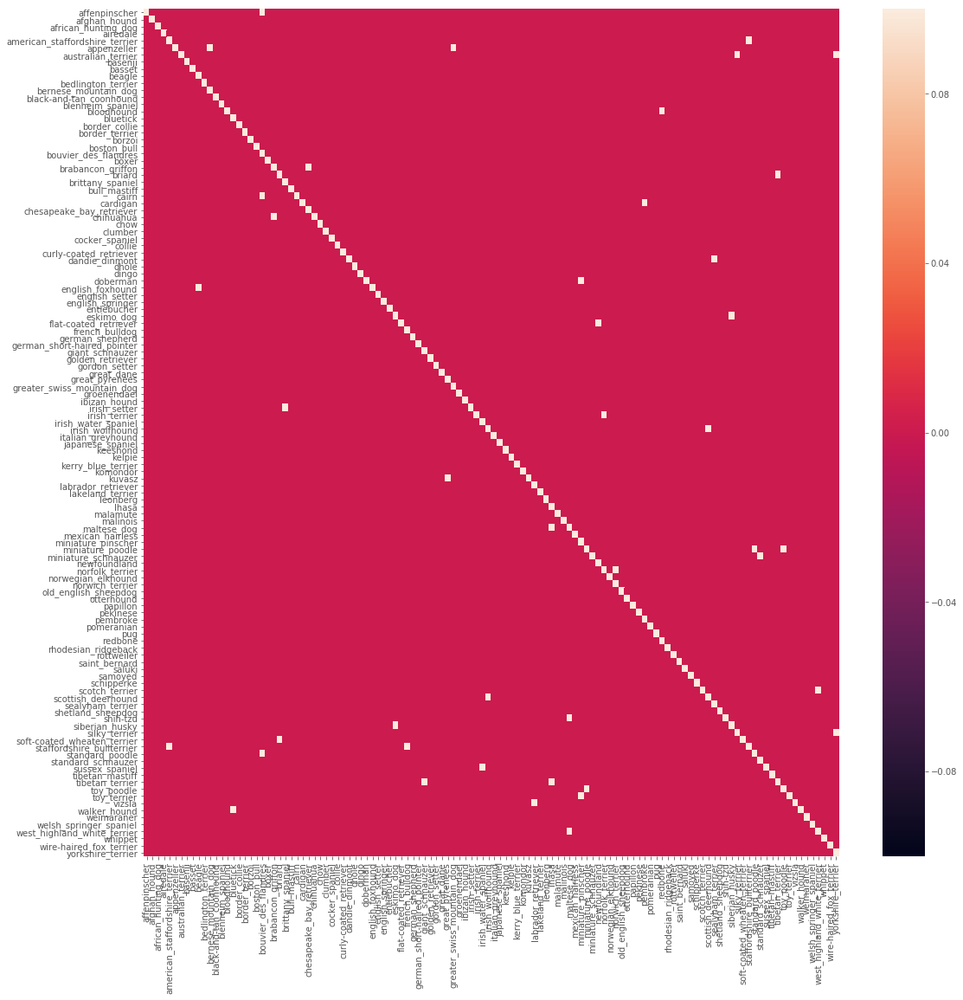

In [63]:
fig, ax = plt.subplots(figsize=(18, 18))
_ = sns.heatmap(cm, ax=ax, yticklabels=breeds, xticklabels=breeds, robust=True)

####  most wrongly predicted pair

In [64]:
pr1=np.array(pr1)
pr1.shape
pr1=pr1.reshape(2046,1)

In [65]:
pr=np.array(pr)
pr=pr.reshape(2046,1)

In [66]:
x=np.concatenate((pr1,pr),axis=1)

In [67]:
x.shape

(2046, 2)

In [68]:
np.savetxt("somefile.csv",x,fmt="%s",header="actual,pred,count",delimiter=',',comments='')

In [69]:
df=pd.read_csv("somefile.csv")

In [70]:
df['count'] = 1

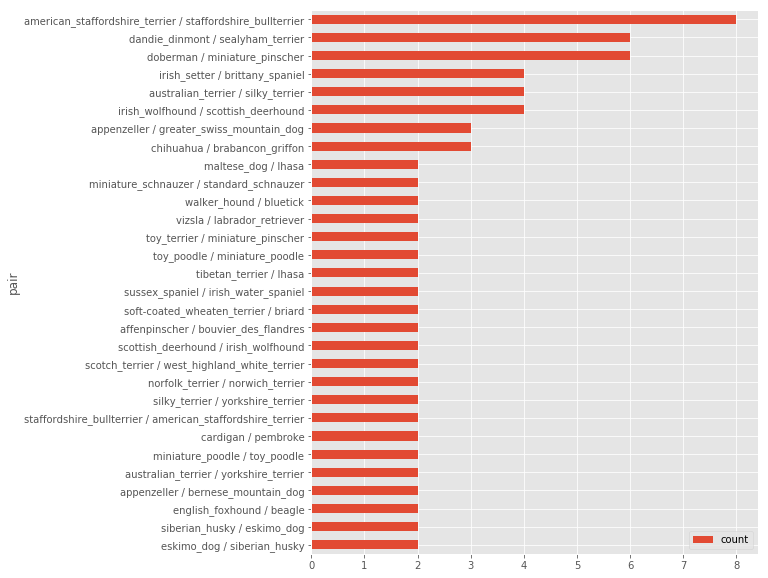

In [71]:

misclass_df = df[df['actual'] != df['pred']].groupby(['actual', 'pred']).sum().sort_values(['count'], ascending=False).reset_index()
misclass_df['pair'] = misclass_df['actual'] + ' / ' + misclass_df['pred']
misclass_df = misclass_df[['pair', 'count']].take(range(30))

misclass_df.sort_values(['count']).plot.barh(figsize=(8, 10), x=misclass_df['pair'])



### to see what our model is seeing
  we are going to implement cam on the single iception_resnetv2 to see at what part our model is looking 

In [359]:
model2=Sequential()
model2.add(Dense(120,input_shape=(1536,),activation='softmax'))

model2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model2.fit(irpreds,y_train,batch_size=50,epochs=10,validation_data=(tirpreds,y_test))

Train on 9199 samples, validate on 1023 samples
Epoch 1/10
9199/9199 [==============================] - 8s 855us/step - loss: 1.5778 - acc: 0.8077 - val_loss: 0.3794 - val_acc: 0.9257
Epoch 2/10
9199/9199 [==============================] - 1s 76us/step - loss: 0.2845 - acc: 0.9364 - val_loss: 0.2495 - val_acc: 0.9345
Epoch 3/10
9199/9199 [==============================] - 1s 72us/step - loss: 0.2107 - acc: 0.9443 - val_loss: 0.2199 - val_acc: 0.9404
Epoch 4/10
9199/9199 [==============================] - 1s 74us/step - loss: 0.1819 - acc: 0.9489 - val_loss: 0.2047 - val_acc: 0.9433
Epoch 5/10
9199/9199 [==============================] - 1s 74us/step - loss: 0.1627 - acc: 0.9522 - val_loss: 0.2092 - val_acc: 0.9384
Epoch 6/10
9199/9199 [==============================] - 1s 75us/step - loss: 0.1497 - acc: 0.9546 - val_loss: 0.2041 - val_acc: 0.9355
Epoch 7/10
9199/9199 [==============================] - 1s 74us/step - loss: 0.1366 - acc: 0.9568 - val_loss: 0.2034 - val_acc: 0.9394
Epoch 

In [361]:
import keras.backend as K

In [304]:
prediction

array([34, 49, 48, ..., 97, 89, 14])

In [307]:
ground=np.argmax(y_test,1)

In [308]:
#no.of samples which were wrong
lis=[]
count=0
for i,j in zip(prediction,ground):
    count+=1
    if i!=j:
        lis.append(count)

In [331]:
len(lis)

66

In [99]:
def get_output_layer(model, layer_name):
    # get the symbolic outputs of each "key" layer (we gave them unique names).
    layer_dict = dict([(layer.name, layer) for layer in model.layers])
    layer = layer_dict[layer_name]
    return layer

In [360]:
#getting the weights of last layer
class_weights = model2.layers[-1].get_weights()[0]

In [270]:
#getting the final conv layer 
final_conv_layer3 = get_output_layer(base_model3, "conv_7b_ac")

#building the function to get the output of given layer
get_output3 = K.function([base_model3.layers[0].input], [final_conv_layer3.output])

#getting the output of the conv
[conv_outputs] = get_output3([X_test[21].reshape(1,400,400,3)])

76
ground_truth :  miniature_poodle
prediction :  toy_poodle
(11, 11, 1536)
(11, 1536)


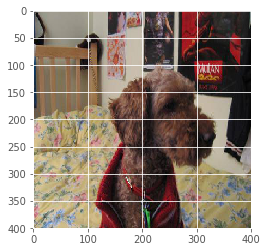

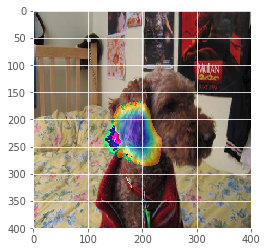

7
ground_truth :  basenji
prediction :  basenji
(11, 11, 1536)
(11, 1536)


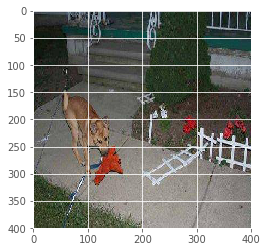

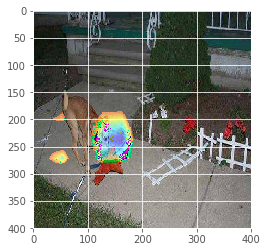

57
ground_truth :  irish_terrier
prediction :  norfolk_terrier
(11, 11, 1536)
(11, 1536)


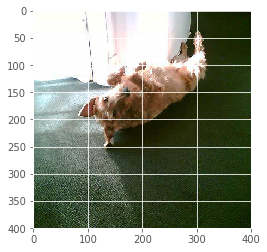

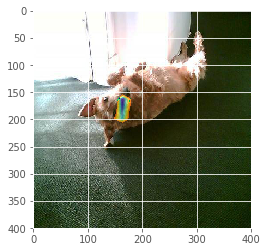

21
ground_truth :  boxer
prediction :  bull_mastiff
(11, 11, 1536)
(11, 1536)


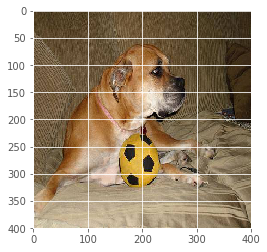

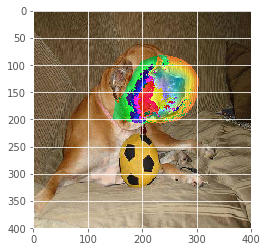

56
ground_truth :  irish_setter
prediction :  cardigan
(11, 11, 1536)
(11, 1536)


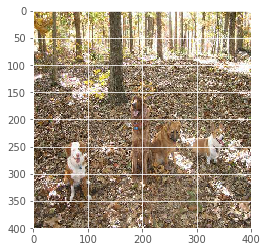

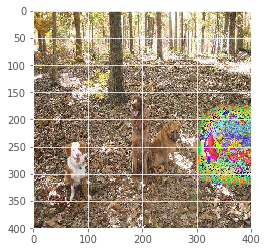

109
ground_truth :  tibetan_terrier
prediction :  giant_schnauzer
(11, 11, 1536)
(11, 1536)


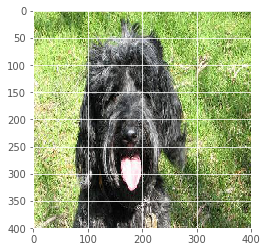

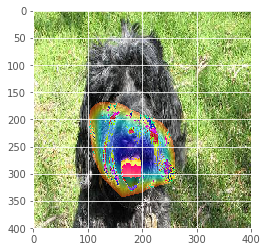

29
ground_truth :  chihuahua
prediction :  standard_schnauzer
(11, 11, 1536)
(11, 1536)


/work/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in true_divide
/work/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in true_divide
/work/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in less


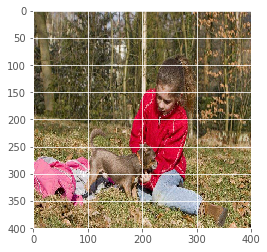

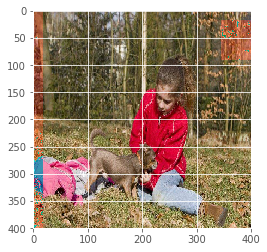

112
ground_truth :  vizsla
prediction :  labrador_retriever
(11, 11, 1536)
(11, 1536)


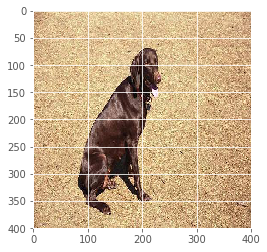

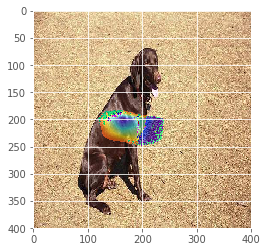

76
ground_truth :  miniature_poodle
prediction :  toy_poodle
(11, 11, 1536)
(11, 1536)


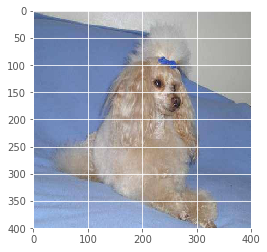

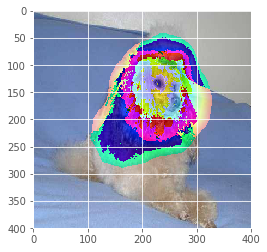

6
ground_truth :  australian_terrier
prediction :  yorkshire_terrier
(11, 11, 1536)
(11, 1536)


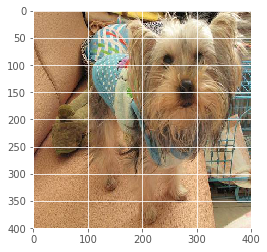

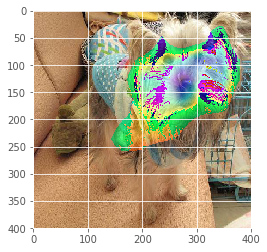

6
ground_truth :  australian_terrier
prediction :  yorkshire_terrier
(11, 11, 1536)
(11, 1536)


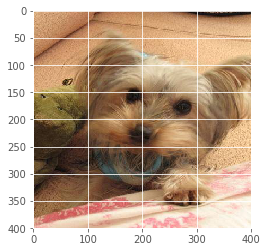

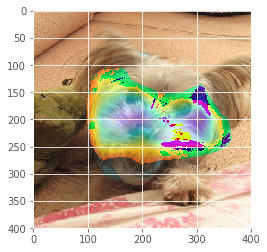

32
ground_truth :  cocker_spaniel
prediction :  clumber
(11, 11, 1536)
(11, 1536)


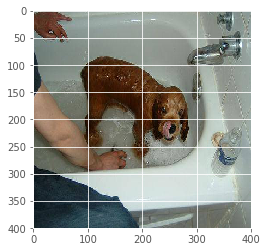

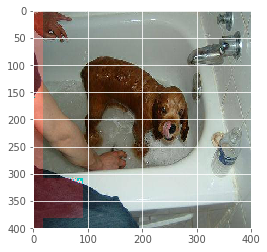

104
ground_truth :  staffordshire_bullterrier
prediction :  american_staffordshire_terrier
(11, 11, 1536)
(11, 1536)


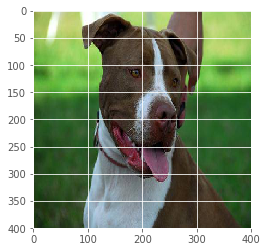

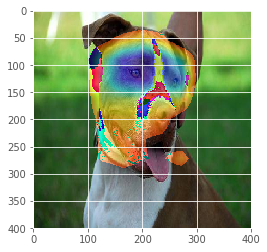

43
ground_truth :  eskimo_dog
prediction :  siberian_husky
(11, 11, 1536)
(11, 1536)


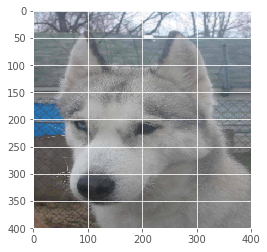

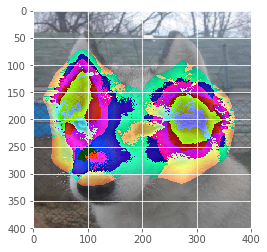

5
ground_truth :  appenzeller
prediction :  bernese_mountain_dog
(11, 11, 1536)
(11, 1536)


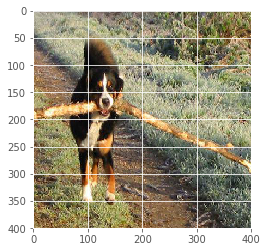

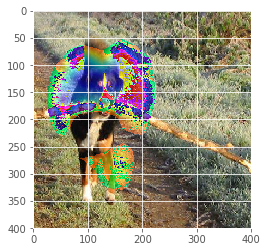

104
ground_truth :  staffordshire_bullterrier
prediction :  staffordshire_bullterrier
(11, 11, 1536)
(11, 1536)


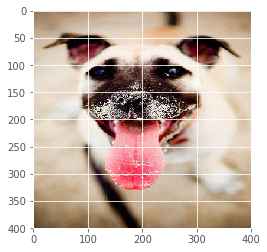

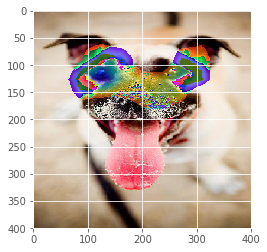

6
ground_truth :  australian_terrier
prediction :  australian_terrier
(11, 11, 1536)
(11, 1536)


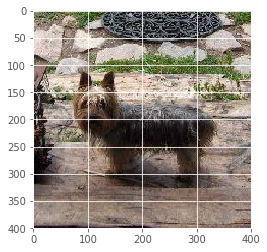

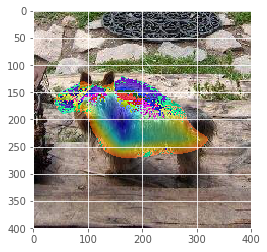

39
ground_truth :  english_foxhound
prediction :  beagle
(11, 11, 1536)
(11, 1536)


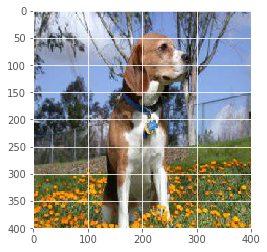

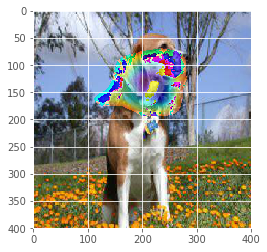

73
ground_truth :  maltese_dog
prediction :  lhasa
(11, 11, 1536)
(11, 1536)


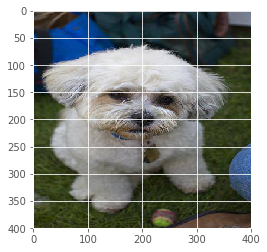

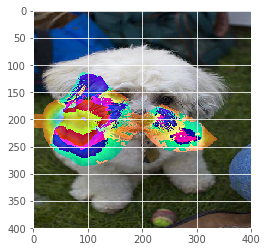

104
ground_truth :  staffordshire_bullterrier
prediction :  staffordshire_bullterrier
(11, 11, 1536)
(11, 1536)


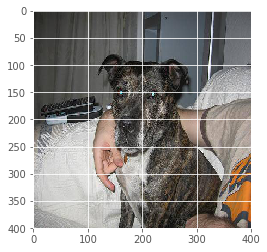

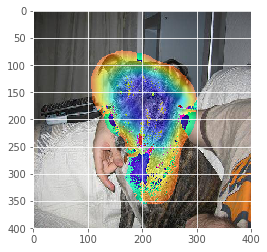

105
ground_truth :  standard_poodle
prediction :  bouvier_des_flandres
(11, 11, 1536)
(11, 1536)


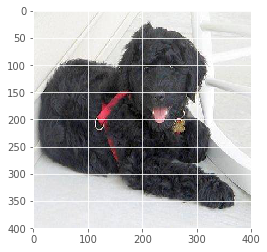

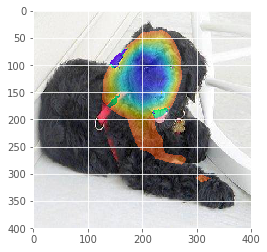

5
ground_truth :  appenzeller
prediction :  greater_swiss_mountain_dog
(11, 11, 1536)
(11, 1536)


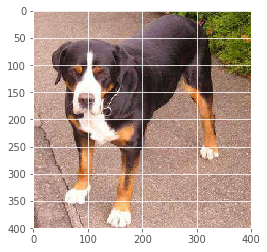

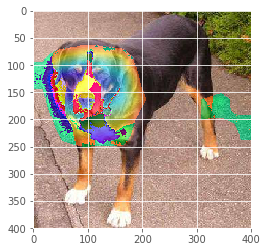

107
ground_truth :  sussex_spaniel
prediction :  irish_water_spaniel
(11, 11, 1536)
(11, 1536)


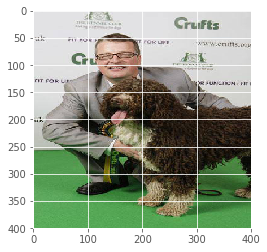

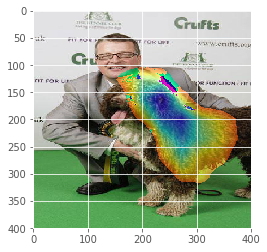

109
ground_truth :  tibetan_terrier
prediction :  lhasa
(11, 11, 1536)
(11, 1536)


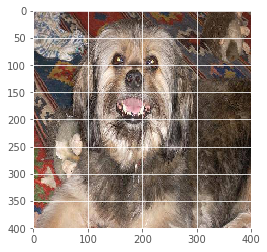

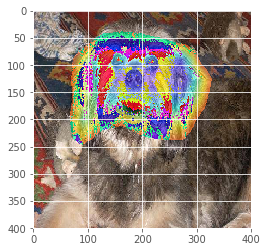

118
ground_truth :  wire-haired_fox_terrier
prediction :  lakeland_terrier
(11, 11, 1536)
(11, 1536)


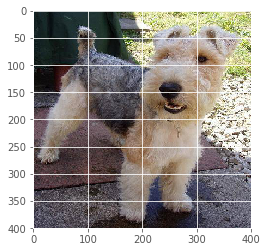

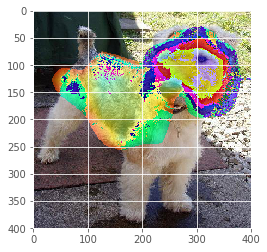

33
ground_truth :  collie
prediction :  shetland_sheepdog
(11, 11, 1536)
(11, 1536)


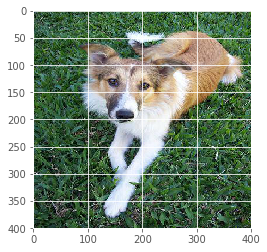

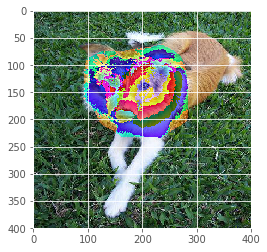

6
ground_truth :  australian_terrier
prediction :  silky_terrier
(11, 11, 1536)
(11, 1536)


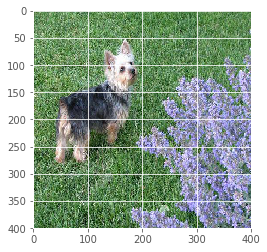

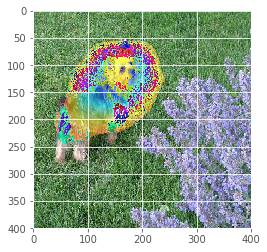

38
ground_truth :  doberman
prediction :  miniature_pinscher
(11, 11, 1536)
(11, 1536)


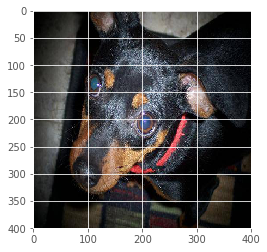

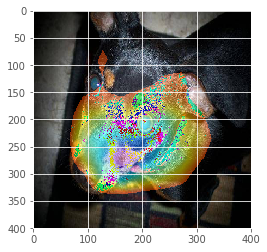

101
ground_truth :  siberian_husky
prediction :  malamute
(11, 11, 1536)
(11, 1536)


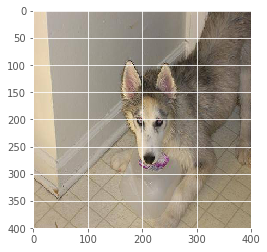

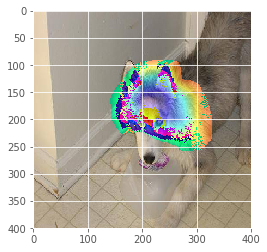

102
ground_truth :  silky_terrier
prediction :  yorkshire_terrier
(11, 11, 1536)
(11, 1536)


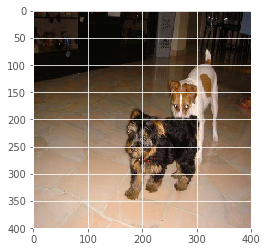

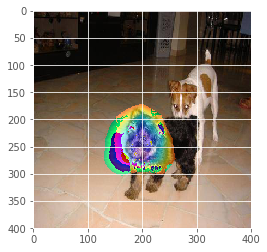

51
ground_truth :  great_dane
prediction :  great_dane
(11, 11, 1536)
(11, 1536)


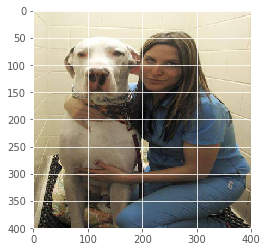

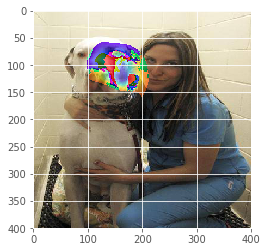

66
ground_truth :  kuvasz
prediction :  borzoi
(11, 11, 1536)
(11, 1536)


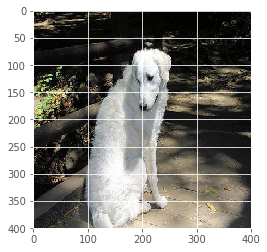

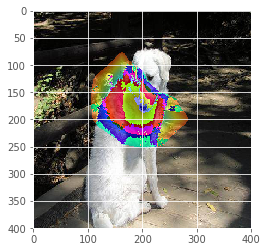

104
ground_truth :  staffordshire_bullterrier
prediction :  staffordshire_bullterrier
(11, 11, 1536)
(11, 1536)


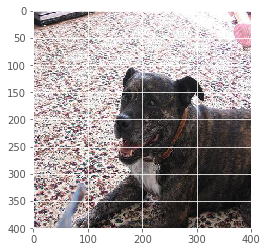

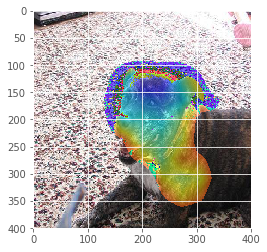

77
ground_truth :  miniature_schnauzer
prediction :  standard_schnauzer
(11, 11, 1536)
(11, 1536)


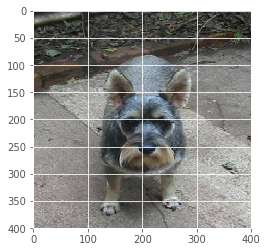

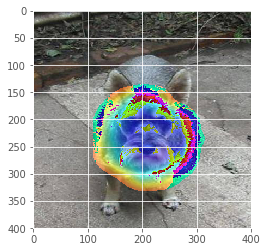

76
ground_truth :  miniature_poodle
prediction :  toy_poodle
(11, 11, 1536)
(11, 1536)


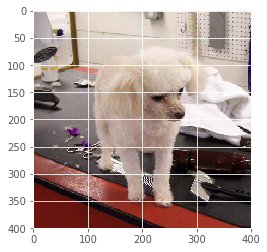

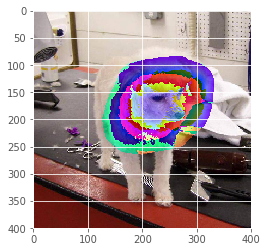

79
ground_truth :  norfolk_terrier
prediction :  norwich_terrier
(11, 11, 1536)
(11, 1536)


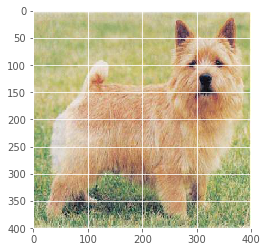

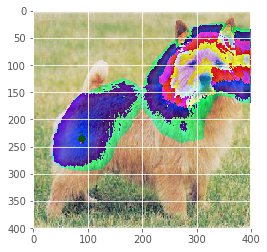

104
ground_truth :  staffordshire_bullterrier
prediction :  staffordshire_bullterrier
(11, 11, 1536)
(11, 1536)


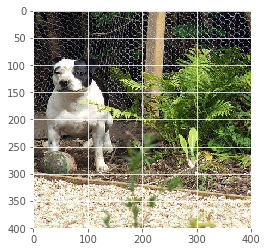

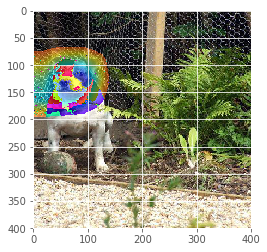

101
ground_truth :  siberian_husky
prediction :  eskimo_dog
(11, 11, 1536)
(11, 1536)


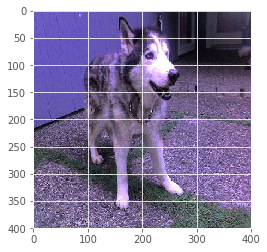

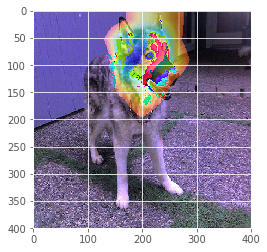

113
ground_truth :  walker_hound
prediction :  bluetick
(11, 11, 1536)
(11, 1536)


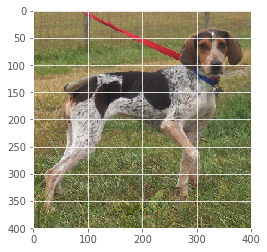

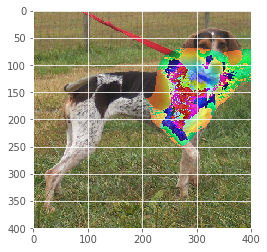

23
ground_truth :  briard
prediction :  whippet
(11, 11, 1536)
(11, 1536)


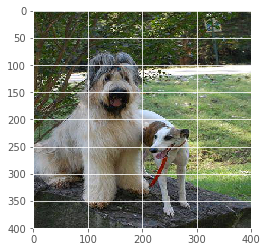

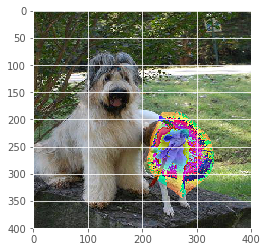

104
ground_truth :  staffordshire_bullterrier
prediction :  french_bulldog
(11, 11, 1536)
(11, 1536)


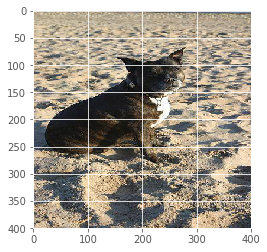

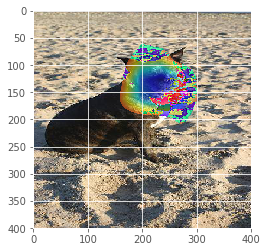

55
ground_truth :  ibizan_hound
prediction :  basenji
(11, 11, 1536)
(11, 1536)


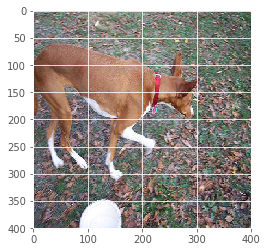

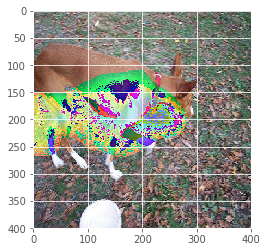

43
ground_truth :  eskimo_dog
prediction :  eskimo_dog
(11, 11, 1536)
(11, 1536)


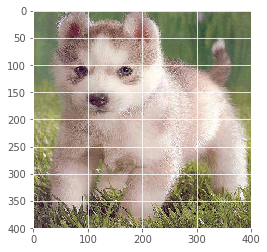

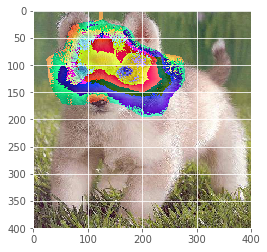

100
ground_truth :  shih-tzu
prediction :  lhasa
(11, 11, 1536)
(11, 1536)


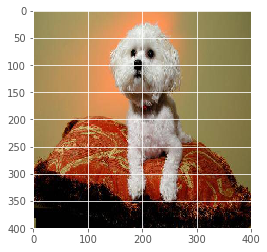

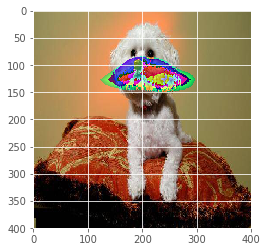

102
ground_truth :  silky_terrier
prediction :  cairn
(11, 11, 1536)
(11, 1536)


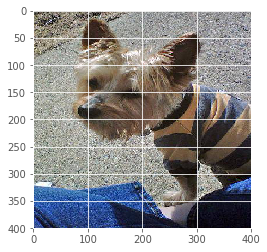

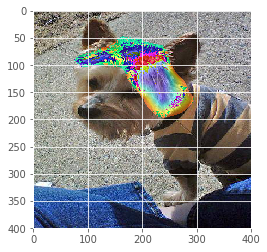

5
ground_truth :  appenzeller
prediction :  bernese_mountain_dog
(11, 11, 1536)
(11, 1536)


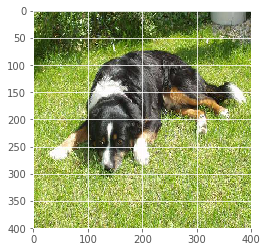

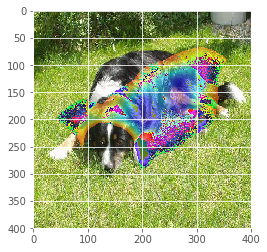

101
ground_truth :  siberian_husky
prediction :  eskimo_dog
(11, 11, 1536)
(11, 1536)


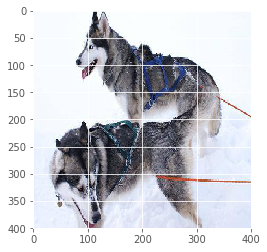

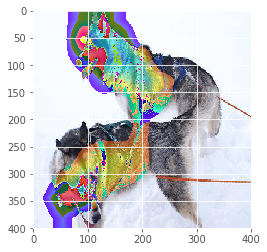

89
ground_truth :  redbone
prediction :  beagle
(11, 11, 1536)
(11, 1536)


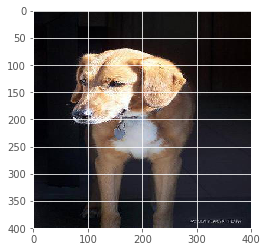

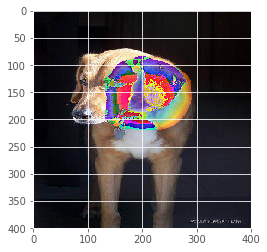

35
ground_truth :  dandie_dinmont
prediction :  wire-haired_fox_terrier
(11, 11, 1536)
(11, 1536)


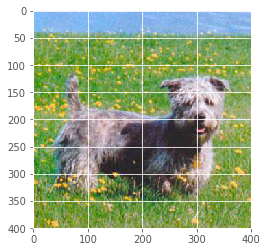

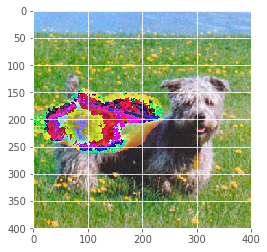

112
ground_truth :  vizsla
prediction :  vizsla
(11, 11, 1536)
(11, 1536)


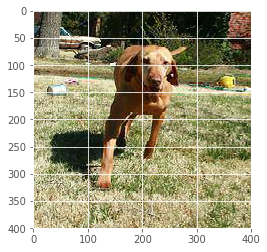

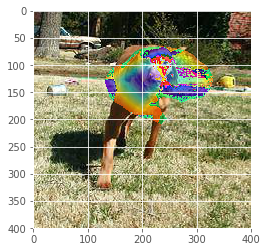

43
ground_truth :  eskimo_dog
prediction :  siberian_husky
(11, 11, 1536)
(11, 1536)


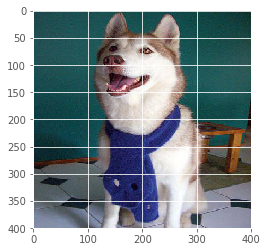

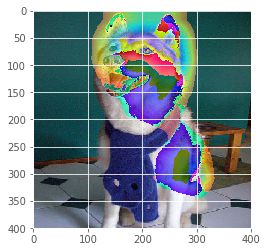

58
ground_truth :  irish_water_spaniel
prediction :  curly-coated_retriever
(11, 11, 1536)
(11, 1536)


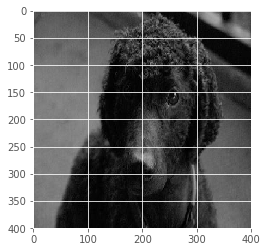

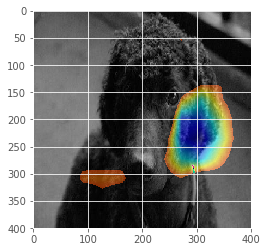

110
ground_truth :  toy_poodle
prediction :  miniature_poodle
(11, 11, 1536)
(11, 1536)


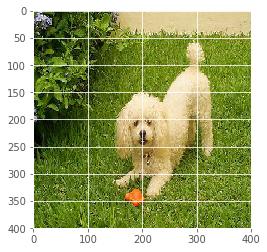

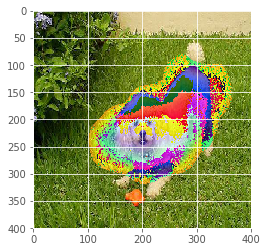

27
ground_truth :  cardigan
prediction :  pembroke
(11, 11, 1536)
(11, 1536)


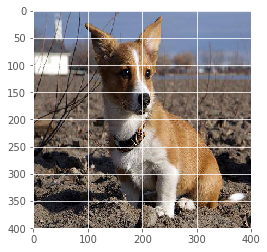

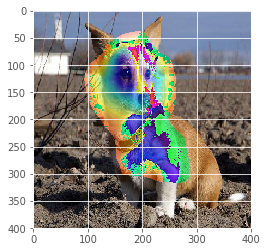

110
ground_truth :  toy_poodle
prediction :  miniature_poodle
(11, 11, 1536)
(11, 1536)


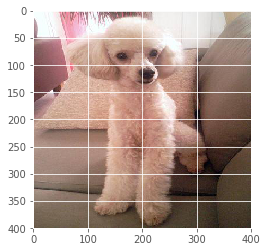

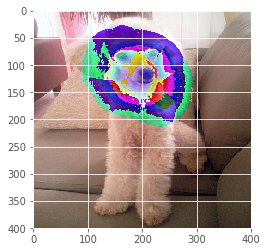

27
ground_truth :  cardigan
prediction :  pembroke
(11, 11, 1536)
(11, 1536)


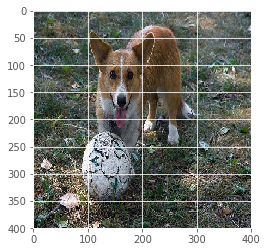

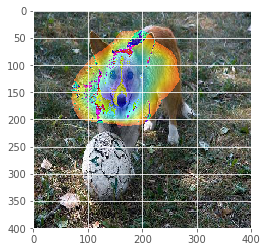

111
ground_truth :  toy_terrier
prediction :  shih-tzu
(11, 11, 1536)
(11, 1536)


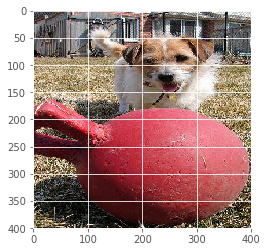

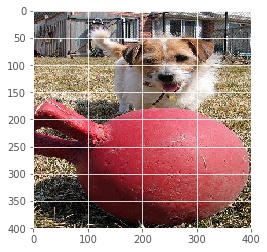

0
ground_truth :  affenpinscher
prediction :  bouvier_des_flandres
(11, 11, 1536)
(11, 1536)


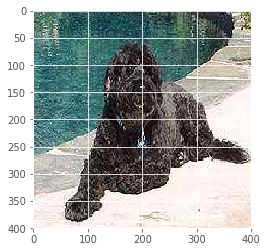

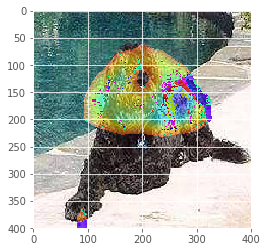

111
ground_truth :  toy_terrier
prediction :  chihuahua
(11, 11, 1536)
(11, 1536)


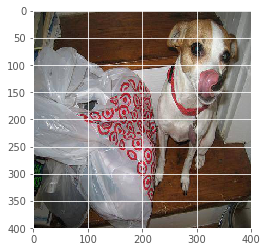

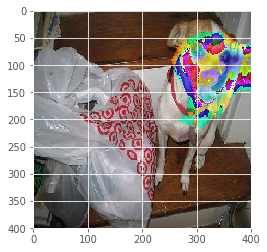

96
ground_truth :  scotch_terrier
prediction :  west_highland_white_terrier
(11, 11, 1536)
(11, 1536)


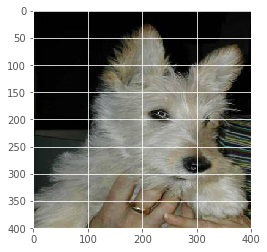

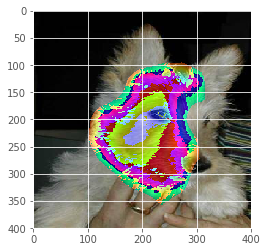

60
ground_truth :  italian_greyhound
prediction :  basenji
(11, 11, 1536)
(11, 1536)


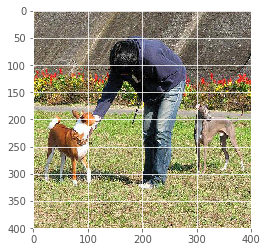

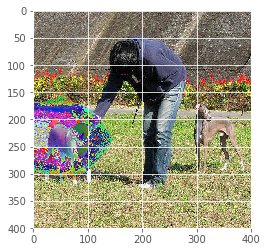

109
ground_truth :  tibetan_terrier
prediction :  tibetan_terrier
(11, 11, 1536)
(11, 1536)


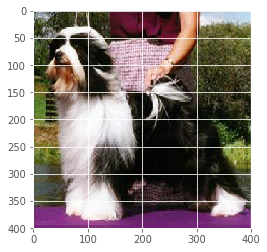

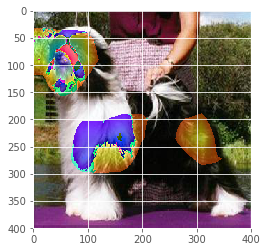

74
ground_truth :  mexican_hairless
prediction :  mexican_hairless
(11, 11, 1536)
(11, 1536)


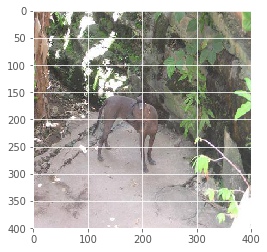

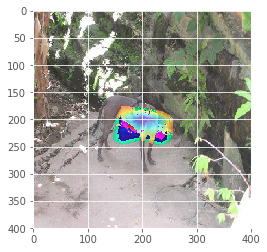

99
ground_truth :  shetland_sheepdog
prediction :  shetland_sheepdog
(11, 11, 1536)
(11, 1536)


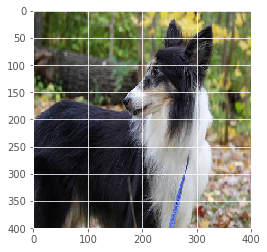

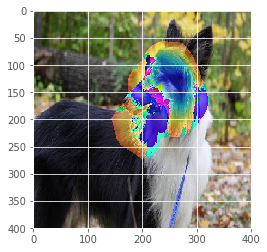

97
ground_truth :  scottish_deerhound
prediction :  irish_wolfhound
(11, 11, 1536)
(11, 1536)


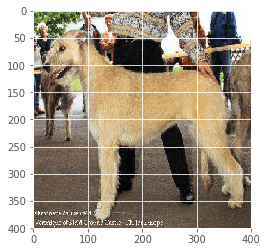

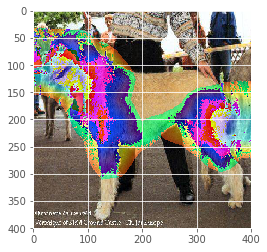

77
ground_truth :  miniature_schnauzer
prediction :  standard_schnauzer
(11, 11, 1536)
(11, 1536)


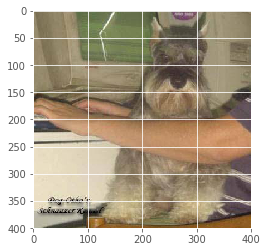

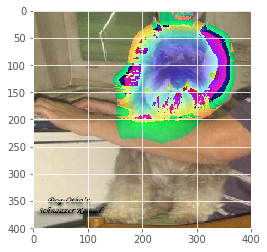

In [369]:
#cam for the wrongly predicted classes
for j in lis:
    print(np.argmax(y_test[j-1]))

    prediction=np.argmax(model2.predict(tirpreds[j-1].reshape(1,1536)))
    print('ground_truth : ',list_of_breeds[np.argmax(y_test[j-1])])
    print('prediction : ', list_of_breeds[prediction])


    [conv_outputs] = get_output3([X_test[j-1].reshape(1,400,400,3)])
    conv_outputs = conv_outputs[0, :, :, :]
    print(conv_outputs.shape)
    shape = conv_outputs.shape[1:3]
    print(shape)
    cam = np.zeros(dtype = np.float32, shape = conv_outputs.shape[0:2])
    for i, w in enumerate(class_weights[:,prediction]):
           cam += w * conv_outputs[ :, :,i]
    #print ("predictions", predictions)


    cam /= np.max(cam)
    cam = cv2.resize(cam, (400, 400))


    heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
    heatmap[np.where(cam < 0.2)] = 0
    img1 = heatmap*0.5 + X_test[j-1]*255
    plt.imshow(X_test[j-1])
    plt.show()
    plt.imshow(img1/255)
    plt.show()